In [1]:
import os, cv2
import numpy as np
import pandas as pd
import random, tqdm
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import albumentations as album
import segmentation_models_pytorch as smp

from dataset import MassachusettsDataset

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "CPU")


In [2]:
DATA_DIR = '../../data/massachusetts/tiff'

x_train_dir = os.path.join(DATA_DIR, 'train')
y_train_dir = os.path.join(DATA_DIR, 'train_labels')

x_valid_dir = os.path.join(DATA_DIR, 'val')
y_valid_dir = os.path.join(DATA_DIR, 'val_labels')

x_test_dir = os.path.join(DATA_DIR, 'test')
y_test_dir = os.path.join(DATA_DIR, 'test_labels')

In [3]:
class_dict = pd.read_csv("../../data/massachusetts/label_class_dict.csv")
class_names = class_dict['name'].tolist()
class_rgb_values = class_dict[['r','g','b']].values.tolist()

select_classes = ['background', 'road']
select_class_indices = [class_names.index(cls.lower()) for cls in select_classes]
select_class_rgb_values =  [[0,0,0], [255,255,255]]

print('All dataset classes and their corresponding RGB values in labels:')
print('Class Names: ', class_names)
print('Class RGB values: ', class_rgb_values)

print(select_classes)
print(select_class_rgb_values)

All dataset classes and their corresponding RGB values in labels:
Class Names:  ['background', 'road']
Class RGB values:  [[0, 0, 0], [255, 255, 255]]
['background', 'road']
[[0, 0, 0], [255, 255, 255]]


In [4]:
def visualize(**images):
    n_images = len(images)
    plt.figure(figsize=(20,8))
    for idx, (name, image) in enumerate(images.items()):
        plt.subplot(1, n_images, idx + 1)
        plt.xticks([]);
        plt.yticks([])
        plt.title(name.replace('_',' ').title(), fontsize=20)
        plt.imshow(image)
    plt.show()

def colour_code_segmentation(image, label_values):
    colour_codes = np.array(label_values)
    x = colour_codes[image.astype(int)]
    return x

def reverse_one_hot(image):
    x = np.argmax(image, axis = -1)
    return x

def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')


def get_preprocessing(preprocessing_fn=None):
    _transform = []
    if preprocessing_fn:
        _transform.append(album.Lambda(image=preprocessing_fn))
    _transform.append(album.Lambda(image=to_tensor, mask=to_tensor))

    return album.Compose(_transform)

def crop_image(image, target_image_dims=[1500,1500,3]):
    target_size = target_image_dims[0]
    image_size = len(image)
    padding = (image_size - target_size) // 2

    if padding<0:
        return image

    return image[
        padding:image_size - padding,
        padding:image_size - padding,
        :,
    ]

def validation_inference(model, test_dataset, test_dataset_vis, n=None):
    for idx in range(n or len(test_dataset)):
        image, gt_mask = test_dataset[idx]
        image_vis = crop_image(test_dataset_vis[idx][0].astype('uint8'))
        x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)

        pred_mask = model(x_tensor)
        pred_mask = pred_mask.detach().squeeze().cpu().numpy()

        pred_mask = np.transpose(pred_mask,(1,2,0))

        pred_road_heatmap = pred_mask[:,:,select_classes.index('road')]

        pred_mask = crop_image(colour_code_segmentation(reverse_one_hot(pred_mask), select_class_rgb_values))

        gt_mask = np.transpose(gt_mask,(1,2,0))
        gt_mask = crop_image(colour_code_segmentation(reverse_one_hot(gt_mask), select_class_rgb_values))

        visualize(
            original_image = image_vis,
            ground_truth_mask = gt_mask,
            predicted_mask = pred_mask,
            predicted_road_heatmap = pred_road_heatmap
        )


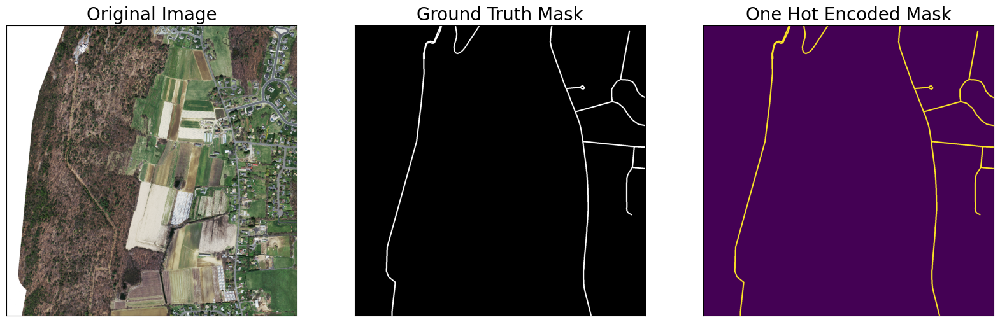

In [5]:
dataset = MassachusettsDataset(x_train_dir, y_train_dir, class_rgb_values=select_class_rgb_values)
random_idx = random.randint(0, len(dataset)-1)
image, mask = dataset[3]

visualize(
    original_image = image,
    ground_truth_mask = colour_code_segmentation(reverse_one_hot(mask), select_class_rgb_values),
    one_hot_encoded_mask = reverse_one_hot(mask)
)

In [6]:
def training_augmentation():
    train_transform = [
        album.RandomCrop(height=256, width=256, always_apply=True),
        album.OneOf(
            [
                album.HorizontalFlip(p=1),
                album.VerticalFlip(p=1),
                album.RandomRotate90(p=1),
            ],
            p=0.75,
        ),
    ]
    return album.Compose(train_transform)

def validation_augmentation():
    test_transform = [
        album.PadIfNeeded(min_height=1536, min_width=1536, always_apply=True, border_mode=0, value=0),
    ]
    return album.Compose(test_transform)


# UNet

In [ ]:
from models import Unet

unet = Unet()

if os.path.exists("./best_model.pth"):
    unet.load_model("./best_model.pth")

train_dataset = MassachusettsDataset(
    x_train_dir, y_train_dir,
    augmentation=training_augmentation(),
    preprocessing=get_preprocessing(unet.preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

valid_dataset = MassachusettsDataset(
    x_valid_dir, y_valid_dir,
    augmentation=validation_augmentation(),
    preprocessing=get_preprocessing(unet.preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4)
valid_loader = DataLoader(valid_dataset, batch_size=1, shuffle=False, num_workers=4)

train_epoch, valid_epoch = unet.get_train_valid_epoch()
EPOCHS = 30
if True:
    best_iou_score = 0.0
    train_logs_list, valid_logs_list = [], []

    for i in range(0, EPOCHS):
        print('\nEpoch: {}'.format(i))
        train_logs = train_epoch.run(train_loader)
        valid_logs = valid_epoch.run(valid_loader)
        train_logs_list.append(train_logs)
        valid_logs_list.append(valid_logs)

        if best_iou_score < valid_logs['iou_score']:
            best_iou_score = valid_logs['iou_score']
            unet.save_model("./best_model")
            print('Model saved!')



Epoch: 0
valid: 100%|██████████| 14/14 [00:02<00:00,  5.12it/s, dice_loss - 0.1187, iou_score - 0.8683]
Model saved!

Epoch: 1
valid: 100%|██████████| 14/14 [00:02<00:00,  4.93it/s, dice_loss - 0.1176, iou_score - 0.8707]
Model saved!

Epoch: 2
valid: 100%|██████████| 14/14 [00:02<00:00,  5.28it/s, dice_loss - 0.1206, iou_score - 0.865] 

Epoch: 3
valid: 100%|██████████| 14/14 [00:02<00:00,  4.85it/s, dice_loss - 0.1188, iou_score - 0.8686]

Epoch: 4
valid: 100%|██████████| 14/14 [00:02<00:00,  5.29it/s, dice_loss - 0.1226, iou_score - 0.8623]

Epoch: 5
valid: 100%|██████████| 14/14 [00:02<00:00,  5.07it/s, dice_loss - 0.1169, iou_score - 0.8708]
Model saved!

Epoch: 6
valid: 100%|██████████| 14/14 [00:02<00:00,  4.97it/s, dice_loss - 0.1187, iou_score - 0.869] 

Epoch: 7
valid: 100%|██████████| 14/14 [00:02<00:00,  4.82it/s, dice_loss - 0.1217, iou_score - 0.8636]

Epoch: 8
valid: 100%|██████████| 14/14 [00:02<00:00,  4.74it/s, dice_loss - 0.1217, iou_score - 0.8629]

Epoch: 9
valid:

valid: 100%|██████████| 49/49 [00:07<00:00,  6.76it/s, dice_loss - 0.1012, iou_score - 0.8994] 
{'dice_loss': np.float32(0.10117049), 'iou_score': np.float32(0.899445)}


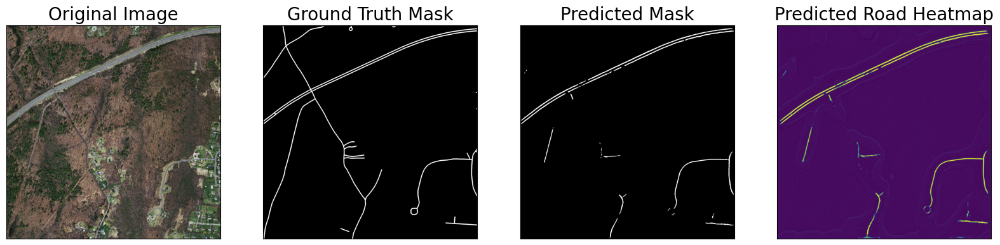

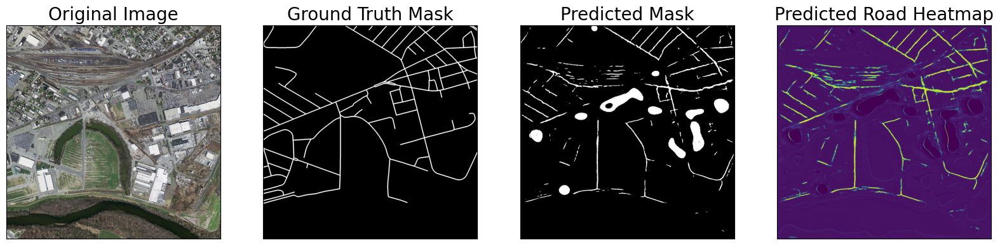

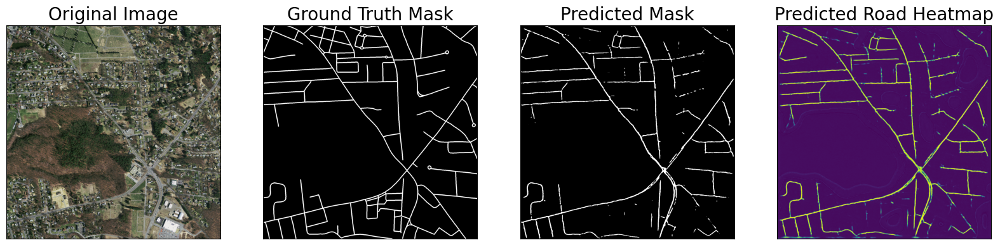

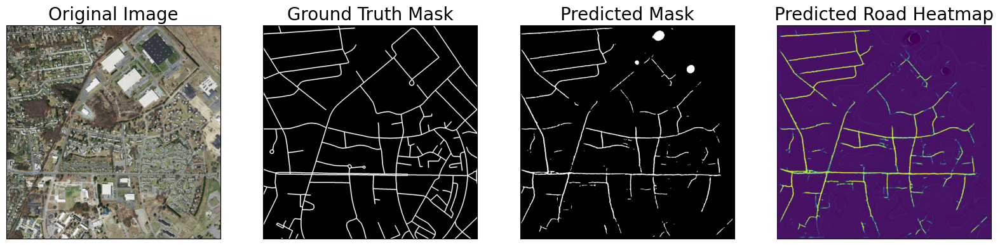

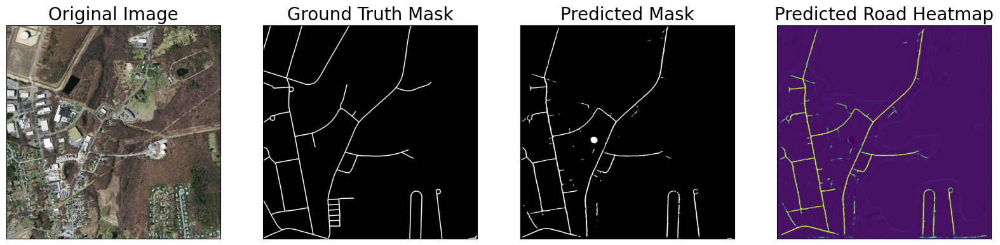

In [8]:
test_dataset = MassachusettsDataset(
    x_test_dir,
    y_test_dir,
    augmentation=validation_augmentation(),
    preprocessing=get_preprocessing(unet.preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

test_dataset_vis = MassachusettsDataset(
    x_test_dir, y_test_dir,
    augmentation=validation_augmentation(),
    class_rgb_values=select_class_rgb_values,
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=4)

print(valid_epoch.run(test_loader))
validation_inference(unet.model, test_dataset, test_dataset_vis, n=5)

# Segformer

In [14]:
from models import Segformer

segformer = Segformer()

if os.path.exists("./segformer_best_model"):
    segformer.load_model("./segformer_best_model")

train_dataset = MassachusettsDataset(
    x_train_dir, y_train_dir,
    augmentation=training_augmentation(),
    preprocessing=get_preprocessing(segformer.preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

valid_dataset = MassachusettsDataset(
    x_valid_dir, y_valid_dir,
    augmentation=validation_augmentation(),
    preprocessing=get_preprocessing(segformer.preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4)
valid_loader = DataLoader(valid_dataset, batch_size=1, shuffle=False, num_workers=4)

train_epoch, valid_epoch = segformer.get_train_valid_epoch()
EPOCHS = 10
if True:
    best_iou_score = 0.0
    train_logs_list, valid_logs_list = [], []

    for i in range(0, EPOCHS):
        print('\nEpoch: {}'.format(i))
        train_logs = train_epoch.run(train_loader)
        valid_logs = valid_epoch.run(valid_loader)
        train_logs_list.append(train_logs)
        valid_logs_list.append(valid_logs)

        if best_iou_score < valid_logs['iou_score']:
            best_iou_score = valid_logs['iou_score']
            segformer.save_model("./segformer_best_model")
            print('Model saved!')




Epoch: 0
valid: 100%|██████████| 14/14 [00:03<00:00,  4.28it/s, dice_loss - 0.09399, iou_score - 0.8387]
Model saved!

Epoch: 1
valid: 100%|██████████| 14/14 [00:03<00:00,  4.44it/s, dice_loss - 0.09377, iou_score - 0.8388]
Model saved!

Epoch: 2
valid: 100%|██████████| 14/14 [00:02<00:00,  4.78it/s, dice_loss - 0.09372, iou_score - 0.8382]

Epoch: 3
valid: 100%|██████████| 14/14 [00:02<00:00,  5.08it/s, dice_loss - 0.09366, iou_score - 0.839] 
Model saved!

Epoch: 4
valid: 100%|██████████| 14/14 [00:02<00:00,  4.87it/s, dice_loss - 0.09371, iou_score - 0.8384]

Epoch: 5
valid: 100%|██████████| 14/14 [00:03<00:00,  4.23it/s, dice_loss - 0.0937, iou_score - 0.8383] 

Epoch: 6
valid: 100%|██████████| 14/14 [00:03<00:00,  4.51it/s, dice_loss - 0.09376, iou_score - 0.8386]

Epoch: 7
valid: 100%|██████████| 14/14 [00:03<00:00,  4.62it/s, dice_loss - 0.09374, iou_score - 0.8381]

Epoch: 8
valid: 100%|██████████| 14/14 [00:03<00:00,  4.52it/s, dice_loss - 0.09389, iou_score - 0.8383]

Epoch:

valid: 100%|██████████| 49/49 [00:08<00:00,  5.89it/s, dice_loss - 0.07314, iou_score - 0.8746]
{'dice_loss': np.float32(0.07313926), 'iou_score': np.float32(0.8745912)}


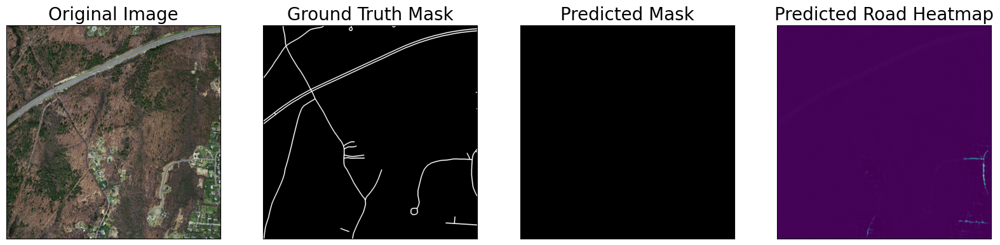

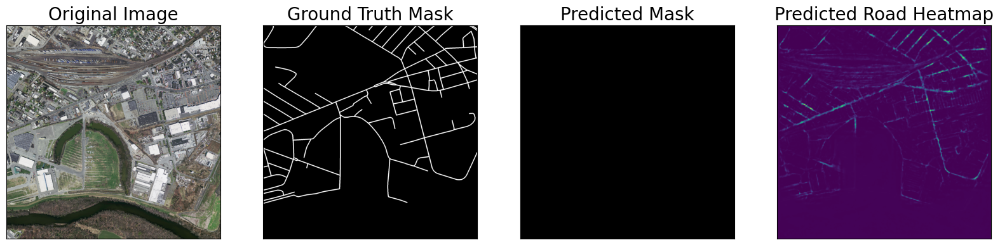

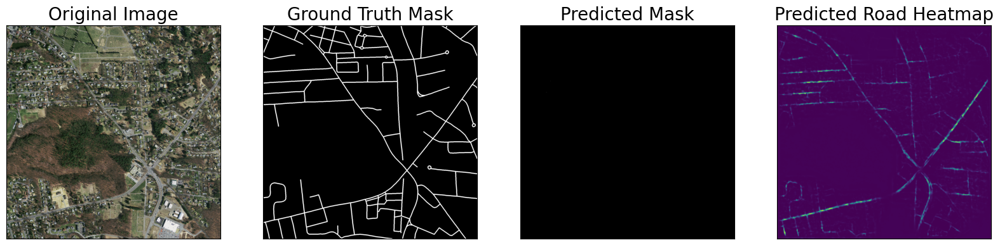

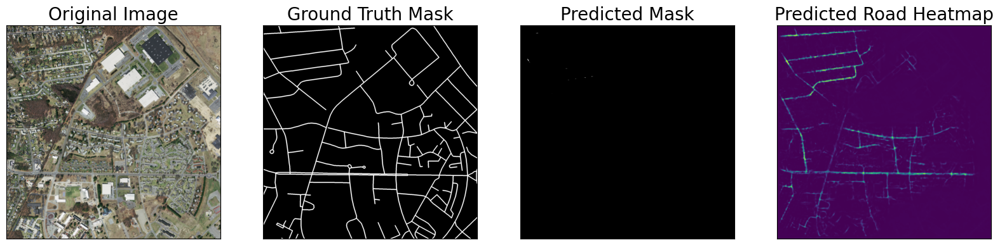

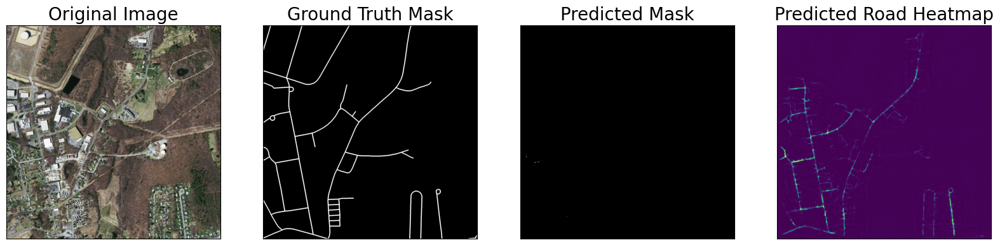

In [15]:
test_dataset = MassachusettsDataset(
    x_test_dir,
    y_test_dir,
    augmentation=validation_augmentation(),
    preprocessing=get_preprocessing(segformer.preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

test_dataset_vis = MassachusettsDataset(
    x_test_dir, y_test_dir,
    augmentation=validation_augmentation(),
    class_rgb_values=select_class_rgb_values,
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=4)

print(valid_epoch.run(test_loader))
validation_inference(segformer.model, test_dataset, test_dataset_vis, n=5)

In [11]:
from models import DeepLabV3Plus

deeplab = DeepLabV3Plus()

if os.path.exists("./deeplab_best_model"):
    deeplab.load_model("./deeplab_best_model")

train_dataset = MassachusettsDataset(
    x_train_dir, y_train_dir,
    augmentation=training_augmentation(),
    preprocessing=get_preprocessing(deeplab.preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

valid_dataset = MassachusettsDataset(
    x_valid_dir, y_valid_dir,
    augmentation=validation_augmentation(),
    preprocessing=get_preprocessing(deeplab.preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4)
valid_loader = DataLoader(valid_dataset, batch_size=1, shuffle=False, num_workers=4)

train_epoch, valid_epoch = deeplab.get_train_valid_epoch()
EPOCHS = 50
if False:
    best_iou_score = 0.0
    train_logs_list, valid_logs_list = [], []

    for i in range(0, EPOCHS):
        print('\nEpoch: {}'.format(i))
        train_logs = train_epoch.run(train_loader)
        valid_logs = valid_epoch.run(valid_loader)
        train_logs_list.append(train_logs)
        valid_logs_list.append(valid_logs)

        if best_iou_score < valid_logs['iou_score']:
            best_iou_score = valid_logs['iou_score']
            deeplab.save_model("./deeplab_best_model")
            print('Model saved!')

valid: 100%|██████████| 49/49 [00:05<00:00,  8.55it/s, dice_loss - 0.2996, iou_score - 0.8294]
{'dice_loss': np.float32(0.29963794), 'iou_score': np.float32(0.8294028)}


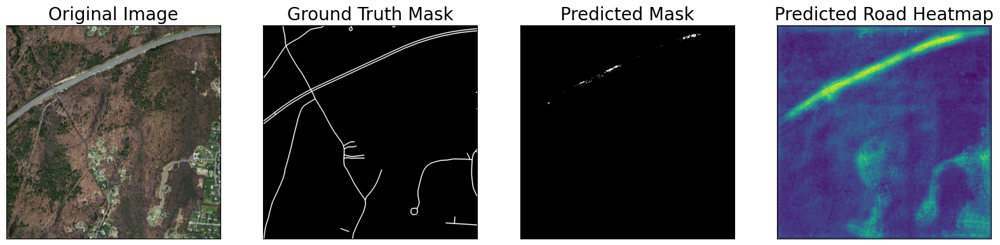

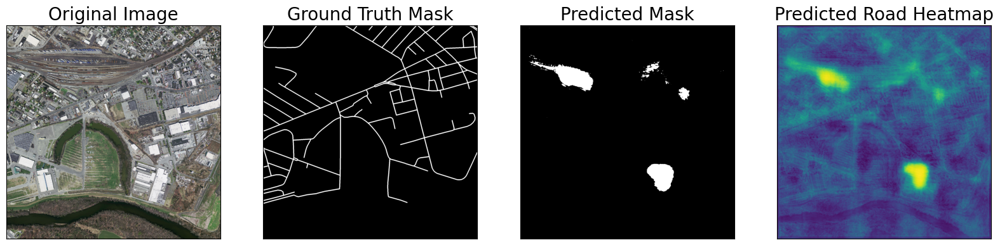

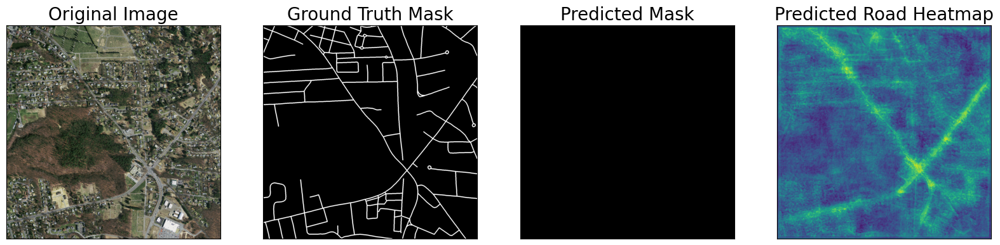

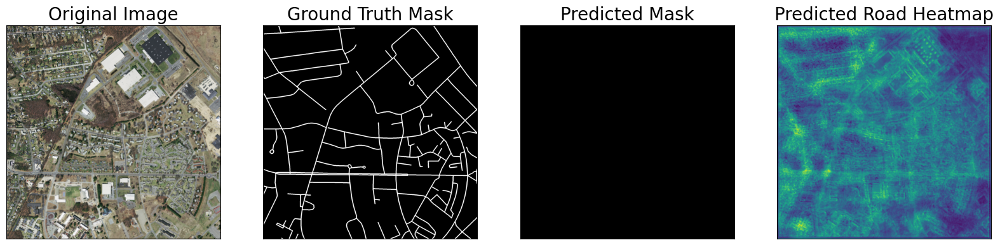

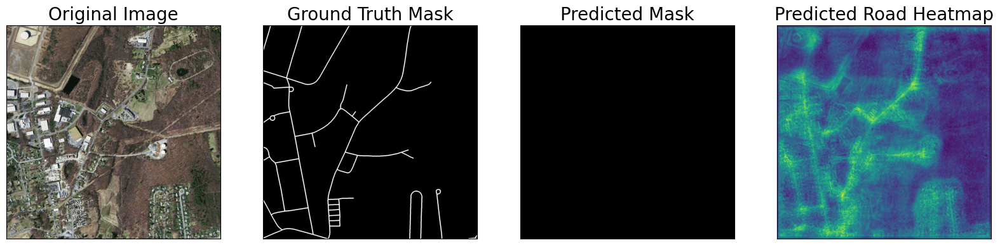

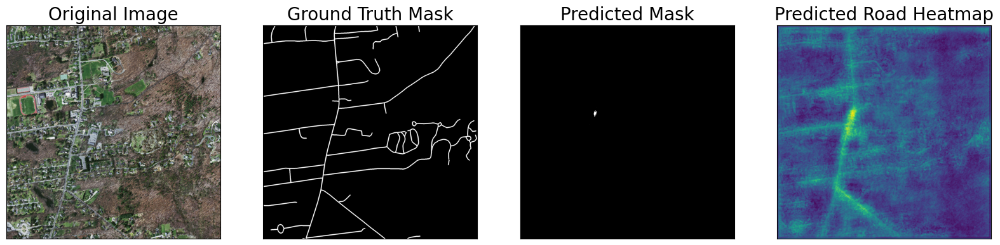

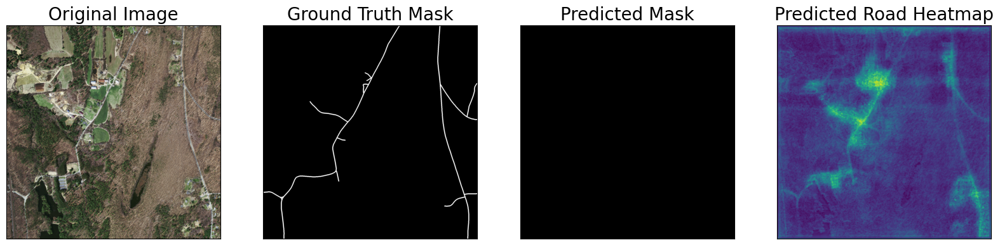

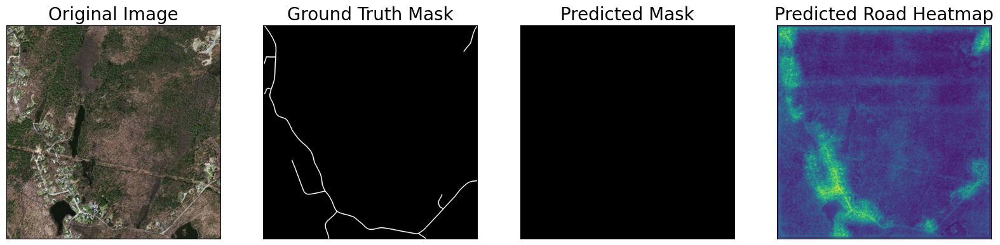

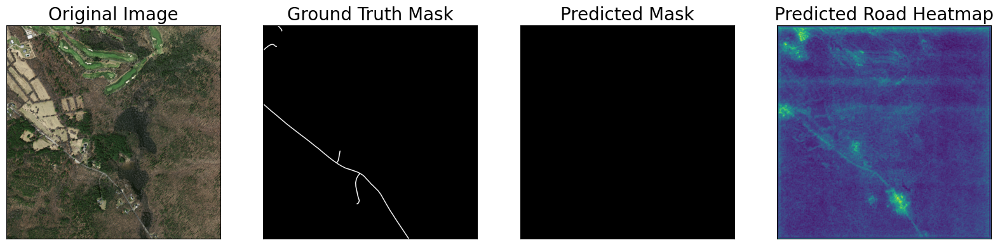

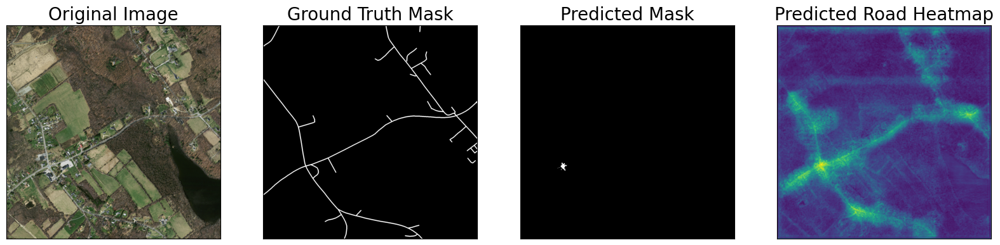

In [12]:
test_dataset = MassachusettsDataset(
    x_test_dir,
    y_test_dir,
    augmentation=validation_augmentation(),
    preprocessing=get_preprocessing(deeplab.preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

test_dataset_vis = MassachusettsDataset(
    x_test_dir, y_test_dir,
    augmentation=validation_augmentation(),
    class_rgb_values=select_class_rgb_values,
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=4)

print(valid_epoch.run(test_loader))
validation_inference(deeplab.model, test_dataset, test_dataset_vis, n=10)